# Setup

## Imports

In [1]:
import os.path
import json
import bcolz

from titlecase import titlecase

vai Modules

In [2]:
import vaidata

from vaiutils import path_consts, plot_images
from vaialgs import BeamPlucker, Builder, TreeSolver, log_probabilities

PyTorch Modules

In [3]:
import torch

import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data.dataloader import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.models import vgg16
from torch.autograd import Variable

## Define useful variables and functions

In [4]:
for k, v in path_consts(['COCO', 'SampleImages']):
    exec(k + '=v')

In [5]:
def pickle_load(filename, path=DIR_CHECKPOINTS, default=None):
    return vaidata.pickle_load(os.path.join(path, filename + '.p'), default)

In [6]:
def load_tensor(filename):
    return bcolz.open(filename)[:]

In [7]:
def load_model():
    global history
    if not os.path.exists(os.path.join(DIR_CHECKPOINTS, 'model.dat')):
        return
    model.load_state_dict(torch.load(
        os.path.join(DIR_CHECKPOINTS, 'model.dat')))
    history = pickle_load('history')

## Load Data

In [8]:
def get_captions(caption_ids):
    if type(caption_ids) is not list:
        return titlecase(' '.join(idx_word[i].title() for i in caption_ids[1:-1]))

    return [get_captions(idx) for idx in caption_ids]

In [9]:
class CustomImageFolder(ImageFolder):
    def __init__(self, folder, transform=None):
        super().__init__(folder, transform)

    def __getitem__(self, index):
        img = super().__getitem__(index)[0]
        filename = os.path.split(self.imgs[index][0])[1]
        try:
            file_id = int(filename[:-4])
            caption_list = captions[file_id]
            caption = torch.FloatTensor(
                caption_list[randint(len(caption_list))].astype('float64'))
        except:
            return img, filename
        return img, filename, caption

In [10]:
class COCOData(CustomImageFolder):
    def __init__(self, transform=None):
        super().__init__(DIR_DATA['COCO'], transform)
        
class SampleData(CustomImageFolder):
    def __init__(self, transform=None):
        super().__init__(DIR_DATA['SampleImages'], transform)

In [11]:
batch_size = 1

In [12]:
transform = transforms.Compose([transforms.Scale(224),
                                transforms.CenterCrop(224),
                                transforms.ToTensor(),
                                transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])
data = DataLoader(COCOData(transform))

In [13]:
feature_dimension = load_tensor(os.path.join(DIR_CHECKPOINTS, 'features')).shape[1]

In [14]:
tokenizer = pickle_load('tokenizer', path=DIR_DATA['COCO'])
vocab_size = tokenizer.num_words
word_idx = {k: v - 1 for k, v in tokenizer.word_index.items()}
idx_word = {v: k for k, v in word_idx.items()}
del tokenizer

Using TensorFlow backend.


# Create Model

In [15]:
vgg = vgg16(pretrained=True).cuda()
vgg.classifier = nn.Sequential(*list(vgg.classifier.children())[:-2])

In [16]:
vgg.eval()
print("Total VGG parameters: {:,}".format(sum([prod(p.data.shape) for p in vgg.parameters()])))

Total VGG parameters: 134,260,544


In [17]:
class Captioner(nn.Module):
    def __init__(self, embedding_size, hidden_size):
        super().__init__()
        self.fc1 = nn.Linear(feature_dimension, hidden_size)
        self.embedding = nn.Embedding(vocab_size, embedding_size)

        self.rnn = nn.RNN(embedding_size, hidden_size, batch_first=True)
        self.fc2 = nn.Linear(hidden_size, vocab_size)

    def forward(self, features, caption):
        x = self.embedding(torch.unsqueeze(caption, 0))
        h0 = torch.unsqueeze(self.fc1(features), 0)
        x = self.rnn(x, h0)[0].squeeze(0)
        return self.fc2(x)

    def sample(self, x, hidden_state=None):
        x = self.embedding(x)
        x = self.rnn(x, hidden_state)[0]
        return torch.log(F.softmax(self.fc2(x.squeeze(0)))).data.cpu().numpy(), x

In [18]:
model = Captioner(64, 512).cuda()
print("Total model parameters: {:,}".format(sum([prod(p.data.shape) for p in model.parameters()])))

Total model parameters: 3,547,600


# Define the Tree Framework for Beam Search

In [19]:
class Caption():
    def __init__(self, nodes=None, preference=None, hidden_state=None):
        self.nodes = nodes
        self.preference = preference
        self.hidden_state = hidden_state

    def description(self):
        return get_captions(np.array(self.nodes))

    def size(self):
        return len(self.nodes)

In [20]:
class CaptionBuilder(Builder):
    def germinate(self, features):
        hidden_state = model.fc1(
            Variable(torch.FloatTensor(features).cuda(), volatile=True))
        for _ in range(2):
            hidden_state = torch.unsqueeze(hidden_state, 0)
        start_token = Variable(torch.LongTensor(
            [[word_idx['`']]]).cuda(), volatile=True)
        preferences, hidden_state = model.sample(start_token, hidden_state)

        return [Caption([i], p, hidden_state) for i, p in enumerate(preferences[0])]

    def build(self, caption):
        preferences, new_hidden_state = model.sample(Variable(torch.LongTensor([[caption.nodes[-1]]]).cuda(), volatile=True),
                                                     caption.hidden_state)
        return [Caption(caption.nodes + [i], caption.preference + p, new_hidden_state) for i, p in enumerate(preferences[0])]

In [21]:
def caption_finder(beam_size=1, probabilistic=False):
    to_probabilities = log_probabilities if probabilistic else None
    return TreeSolver(CaptionBuilder(), BeamPlucker(beam_size, 20, lambda x: x == word_idx['.'],
                                                    to_probabilities))

# Test Model

## Load Model

In [22]:
load_model()
model.eval()

Captioner (
  (fc1): Linear (4096 -> 512)
  (embedding): Embedding(2000, 64)
  (rnn): RNN(64, 512, batch_first=True)
  (fc2): Linear (512 -> 2000)
)

In [23]:
def make_captions(train=True, beam_size=1, probabilistic=True):
    solver = caption_finder(beam_size, probabilistic)
        
    if train:
        sample_iterator = iter(DataLoader(
            COCOData(transform), shuffle=True))
        directory = os.path.join(DIR_DATA['COCO'], 'val2017')
        num_imgs = 1
    else:
        sample_iterator = iter(DataLoader(
            SampleData(transform), shuffle=False))
        directory = os.path.join(DIR_DATA['SampleImages'], 'images')
        num_imgs = len(sample_iterator)
            
    for _ in range(num_imgs):
        img, filename = sample_iterator.next()[:2]
        
        features = vgg(Variable(img, volatile=True).cuda()
                       ).data.cpu().numpy()[0]

        sample_captions = solver.solve(features)
        probabilities = [np.exp(c.preference) for c in sample_captions]
        probabilities /= sum(probabilities)
        probabilities_idx = np.argsort(probabilities)[::-1]

        if len(sample_captions) == 1:
            titles = ''.join(["{}\n".format(sample_captions[i].description())
                              for i in probabilities_idx])
        else:
            titles = ''.join(["{}    ({:.2f})\n".format(sample_captions[i].description(), probabilities[i])
                              for i in probabilities_idx])
            
        true_img = imread(os.path.join(directory, filename[0]))
        
        if train:
            filename = ('last', )
        
        if probabilistic:
            fig = plt.figure()
            plot_images([true_img], titles, flags='retain')
            fig.savefig(os.path.join(DIR_OUTPUT, filename[0]), dpi='figure', bbox_inches='tight')
            plt.show()
        else:
            plot_images([true_img], titles)

## Deterministic Sampling

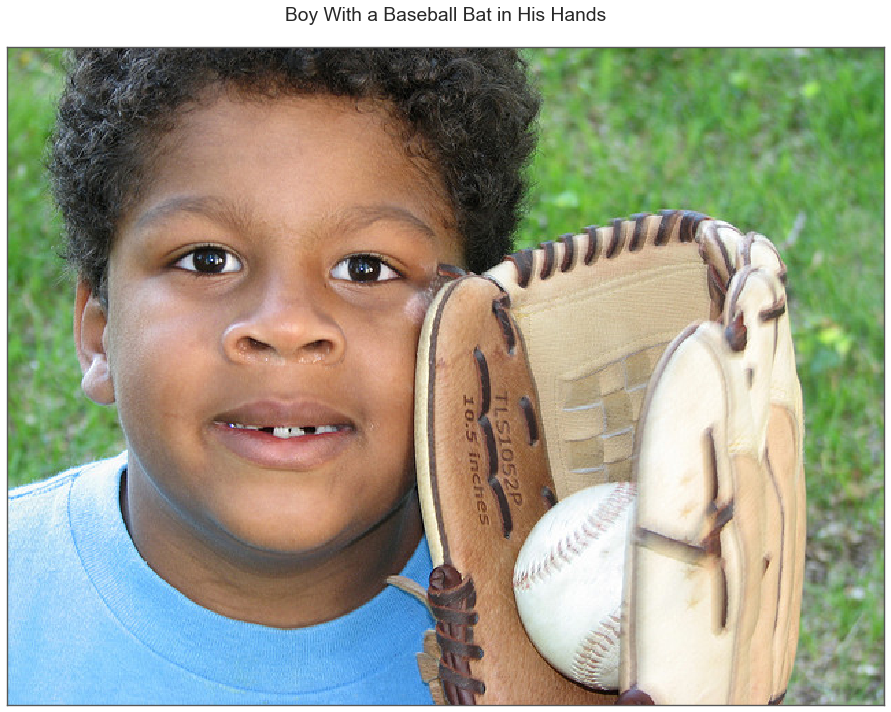

In [31]:
make_captions(probabilistic=False, beam_size=1)

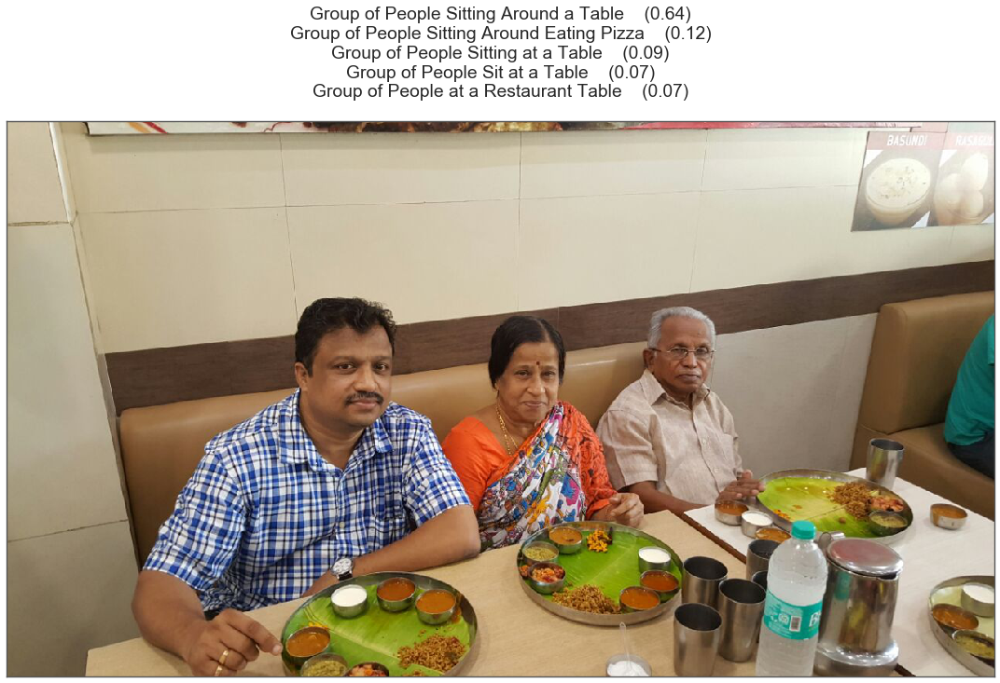

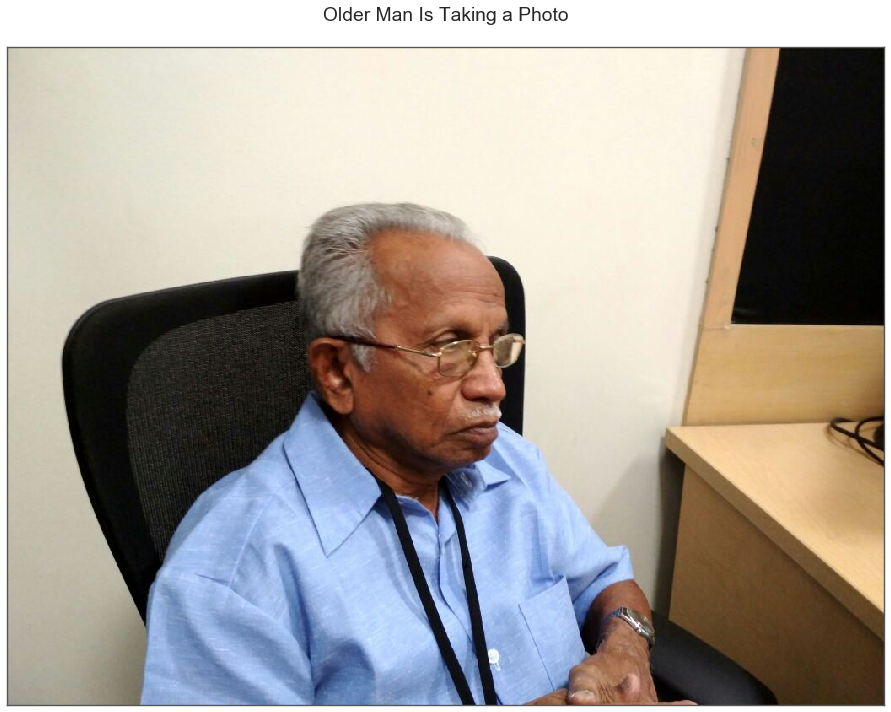

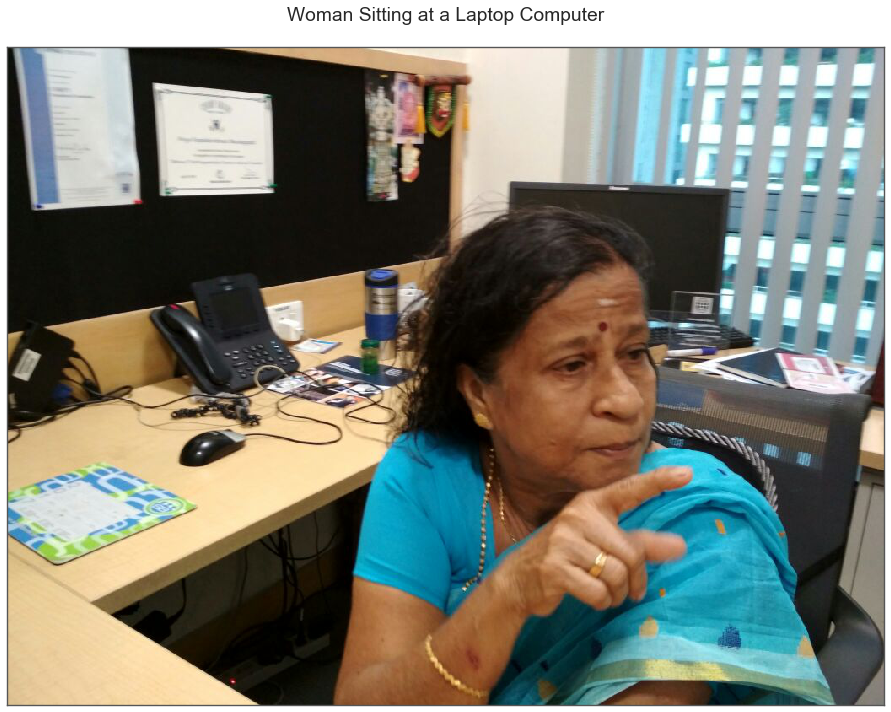

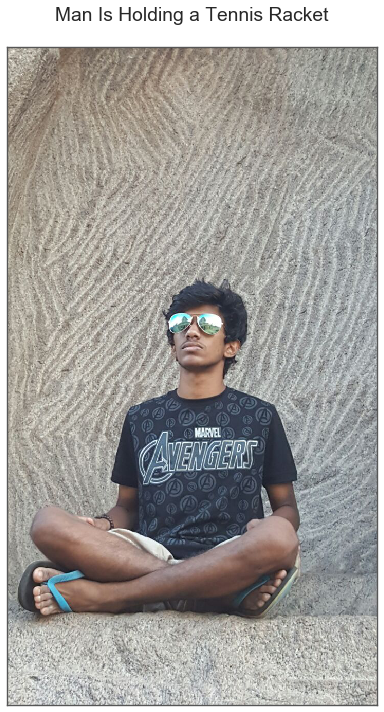

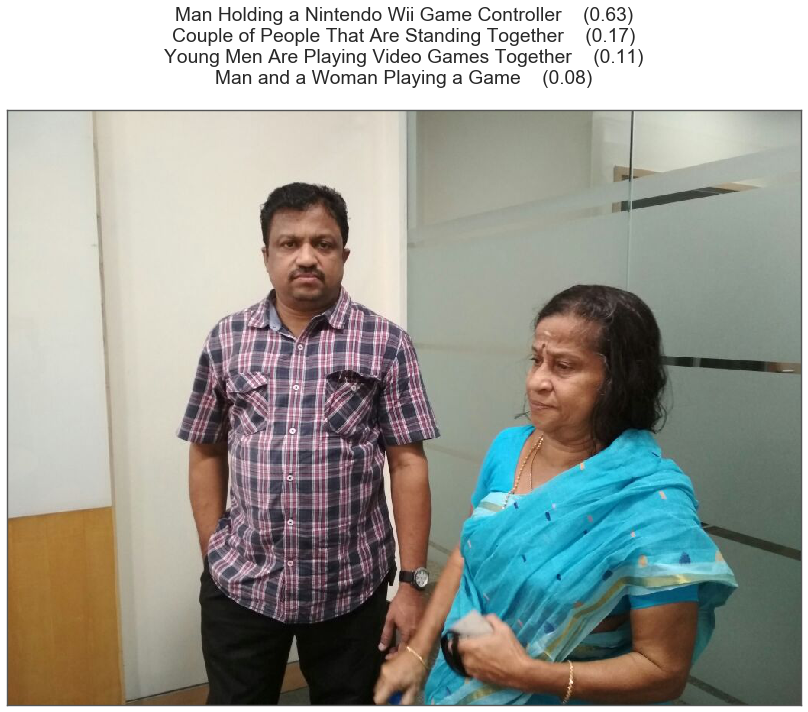

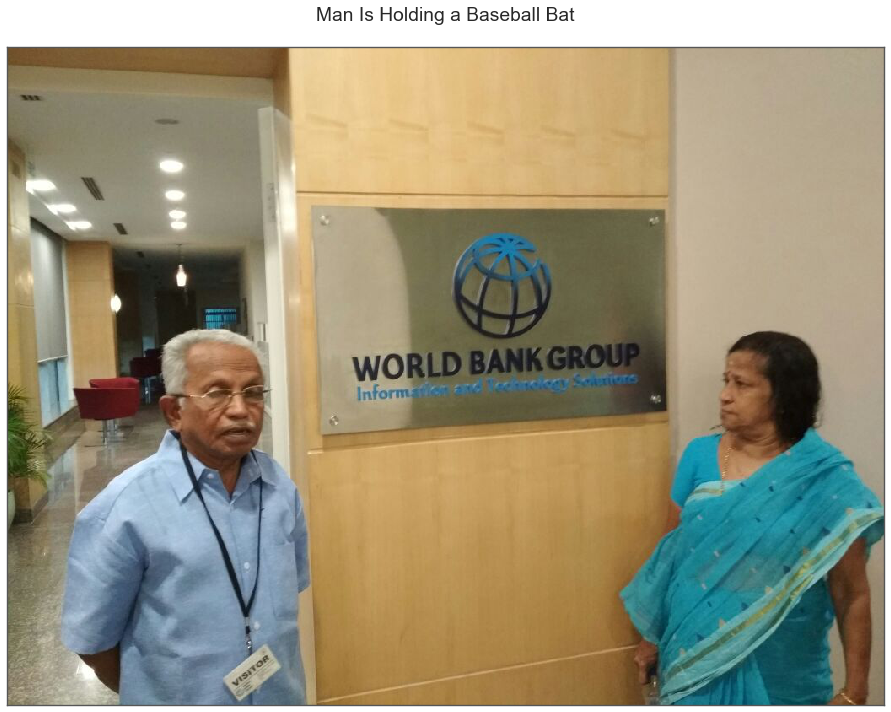

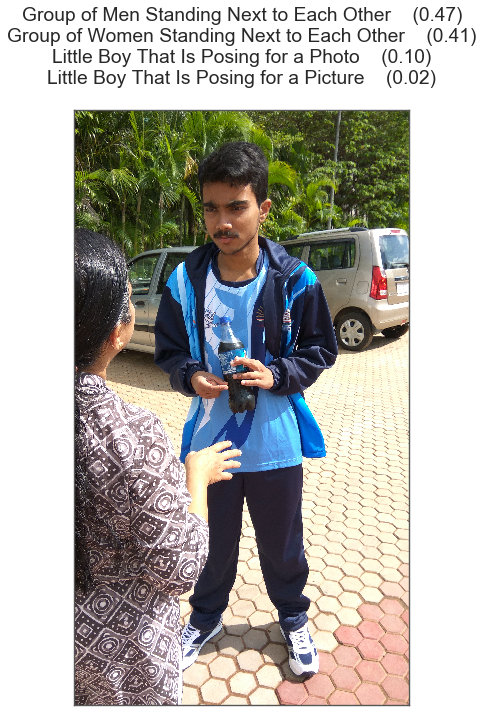

In [24]:
make_captions(train=False, probabilistic=False, beam_size=20)

## Probabilistic Sampling

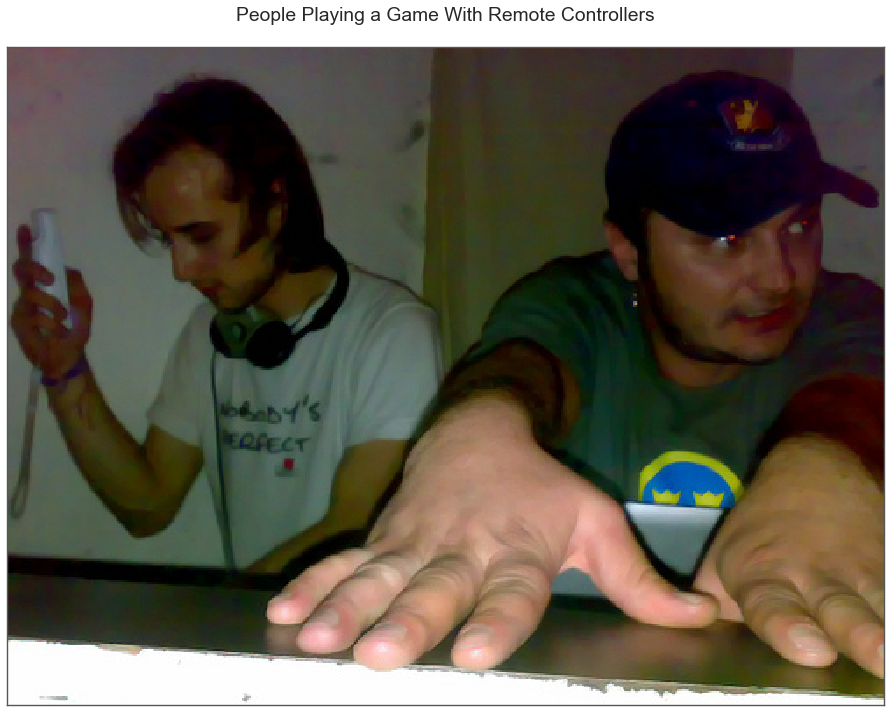

In [43]:
make_captions(beam_size=7)

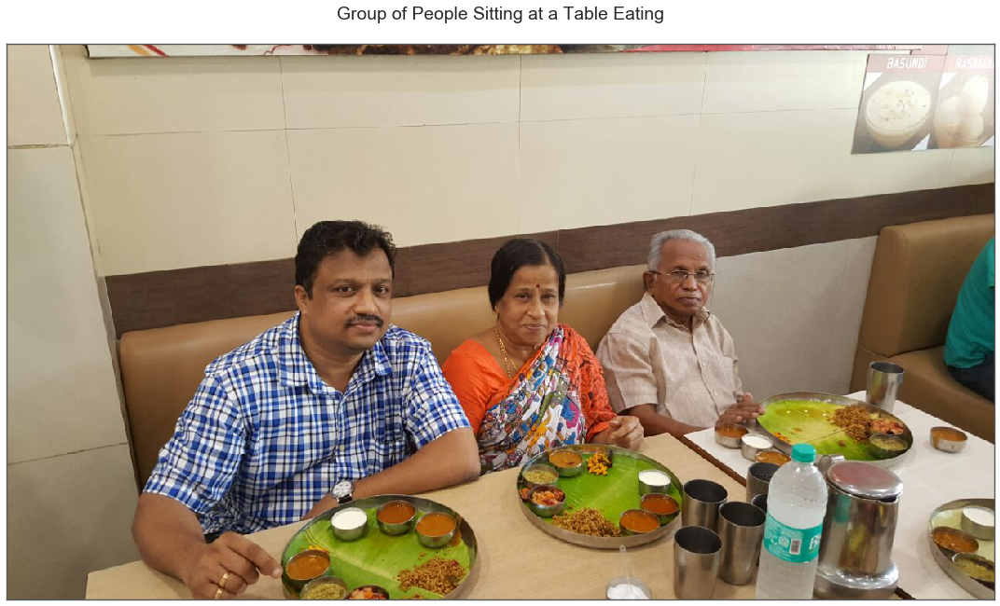

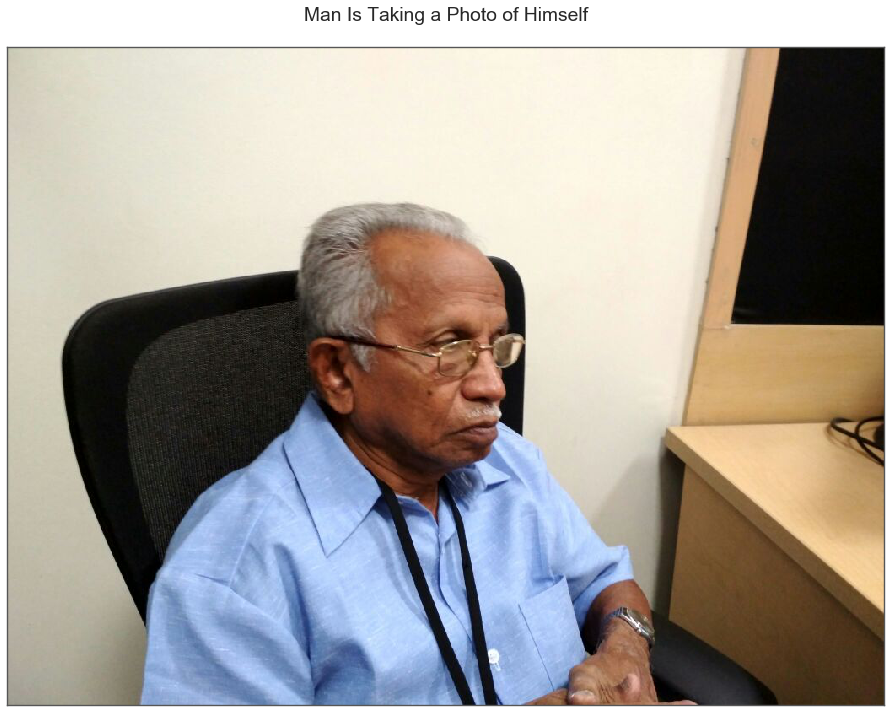

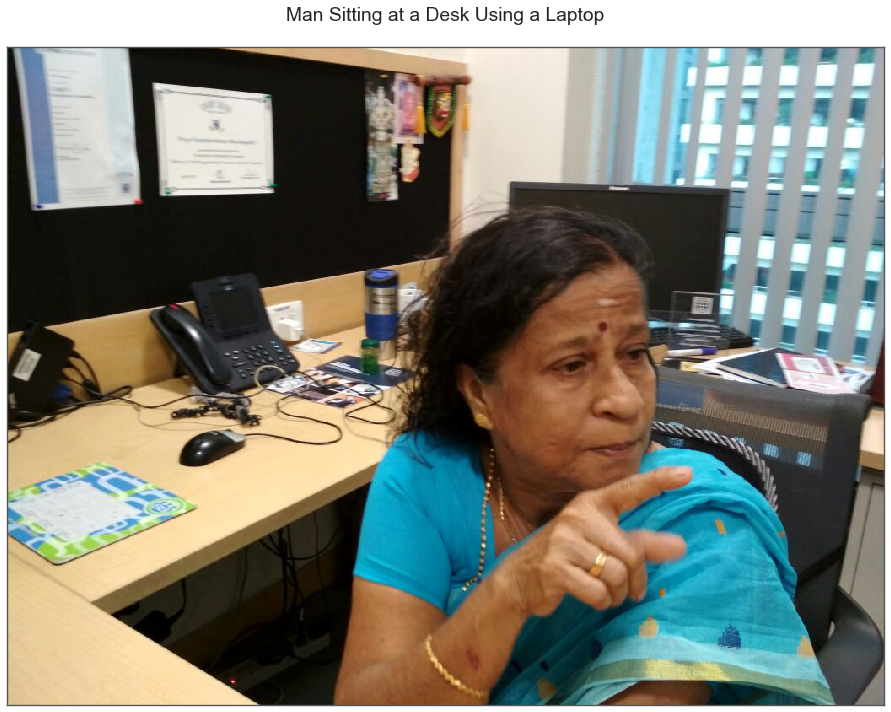

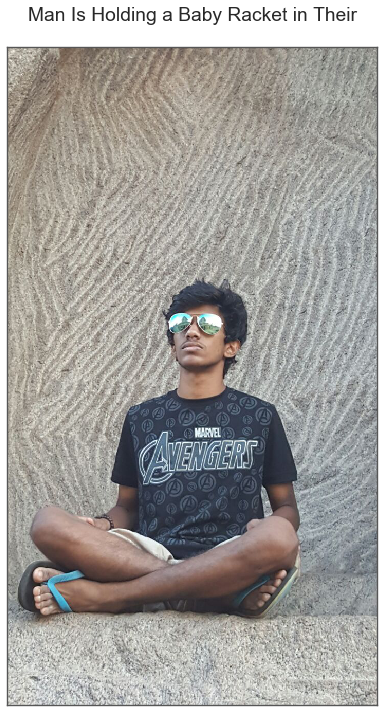

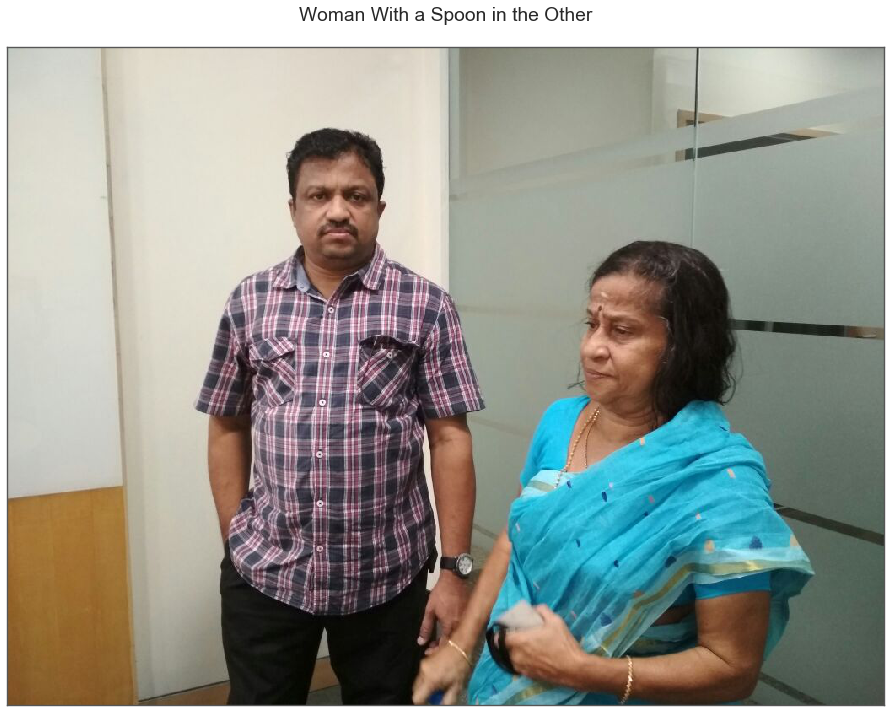

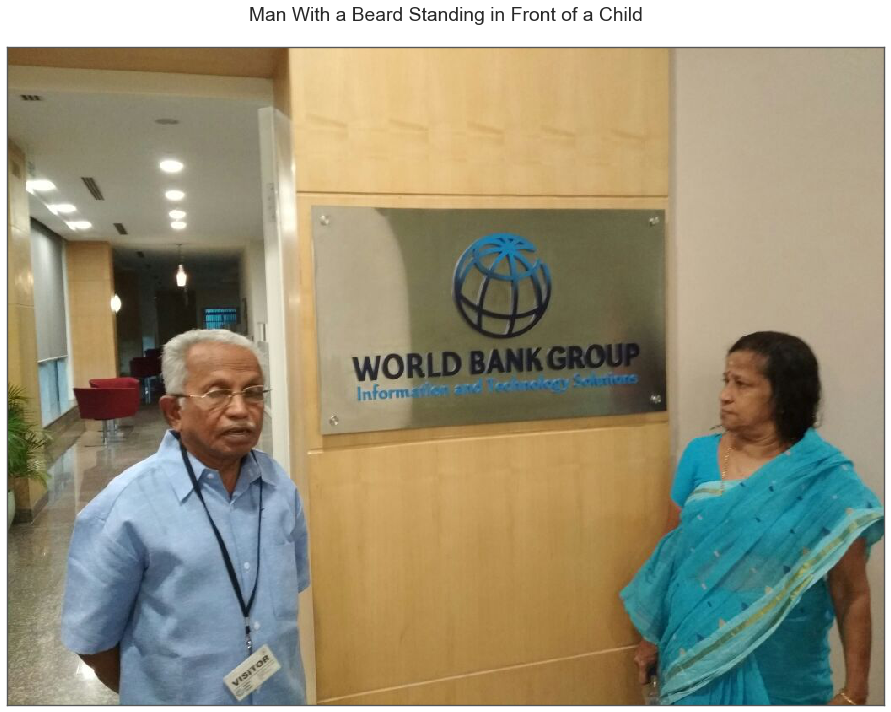

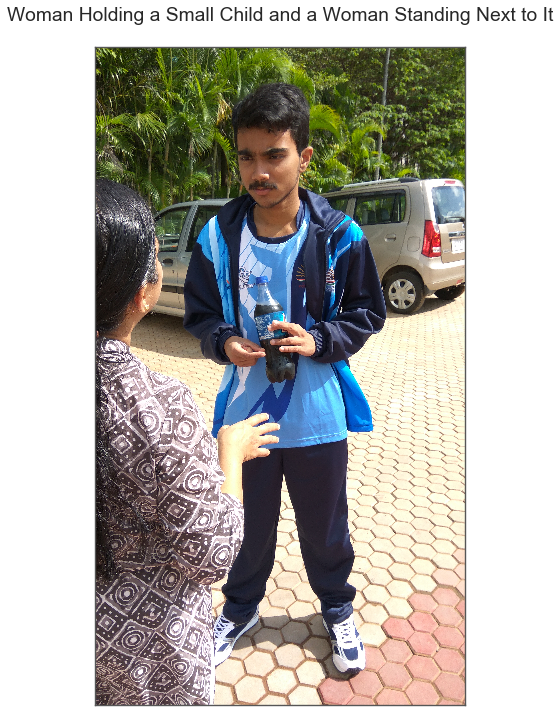

In [25]:
make_captions(train=False, beam_size=7)

## Save Deterministic Captions

In [56]:
def save_captions(train=True):
    mode = 'Train' if train else 'Test'
    filename = os.path.join(DIR_OUTPUT, mode + '.json')
    
    if os.path.exists(os.path.join(DIR_OUTPUT, mode + '.json')):
        with open(os.path.join(DIR_OUTPUT, mode + '.json'), 'r') as f:
            json_file = json.load(f)
            json_data = json_file['data']
    else:
        json_file = {'info': {'training': train, 'probabilistic': False}}
        json_data = []
    
    start_idx = len(json_data)
        
    if train:
        sample_iterator = iter(DataLoader(
            COCOData(transform), shuffle=False))
    else:
        sample_iterator = iter(DataLoader(
            SampleData(transform), shuffle=False))
        
    if start_idx == len(sample_iterator):
        return

    for i in tqdm_notebook(range(len(sample_iterator))):
        iter_next = sample_iterator.next()
        if i < start_idx:
            continue
        
        img, file_id = iter_next[:2]
        
        features = vgg(Variable(img, volatile=True).cuda()
                       ).data.cpu().numpy()[0]
        
        json_data.append({'file_id': file_id[0], 'results': []})
        for beam_size in (1, 3, 5, 7):
            solver = caption_finder(beam_size, probabilistic=False)
            sample_captions = solver.solve(features)
            probabilities = [np.exp(c.preference) for c in sample_captions]
            probabilities /= sum(probabilities)
            probabilities_idx = np.argsort(probabilities)[::-1]

            predicted_captions = [sample_captions[i].description() for i in probabilities_idx]
            probabilities = probabilities[probabilities_idx].tolist()

            if len(predicted_captions) == 1:
                json_data[-1]['results'].append({'beam_size': beam_size, 'captions': predicted_captions[0]})
            else:
                json_data[-1]['results'].append({'beam_size': beam_size, 'captions': predicted_captions, 'probabilities': probabilities})

        json_file['data'] = json_data
        with open(filename, 'w') as f:
            json.dump(json_file, f)
            
    json_file['data'] = json_data
    with open(filename, 'w') as f:
        json.dump(json_file, f)

In [57]:
save_captions()
save_captions(train=False)